In [43]:
%matplotlib inline
from __future__ import print_function
# import ganymede
# ganymede.configure('uav.beaver.works')
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
from matplotlib.patches import Rectangle

In [ ]:
#ganymede.name('YOUR NAME HERE')
def check(p): pass
check(0)

In [44]:
stopsigns = glob.glob("stopsigns/*.jpg")
stopsigns = [cv2.imread(s, cv2.IMREAD_COLOR) for s in stopsigns]
# print( "{} stop signs in dataset".format(len(stopsigns)))

len(stopsigns)
stopsigns[0]

array([[[242, 201, 168],
        [243, 202, 169],
        [244, 203, 170],
        ...,
        [189, 152, 132],
        [185, 148, 126],
        [153, 119,  96]],

       [[250, 207, 174],
        [248, 207, 174],
        [250, 207, 174],
        ...,
        [212, 175, 155],
        [187, 152, 132],
        [143, 111,  88]],

       [[255, 211, 177],
        [254, 212, 177],
        [255, 210, 176],
        ...,
        [202, 164, 146],
        [169, 136, 117],
        [129,  98,  77]],

       ...,

       [[161, 163, 163],
        [151, 153, 153],
        [156, 158, 158],
        ...,
        [ 81,  94, 110],
        [ 86, 100, 118],
        [ 53,  68,  87]],

       [[157, 159, 159],
        [147, 149, 149],
        [152, 154, 154],
        ...,
        [ 79,  92, 108],
        [ 99, 113, 131],
        [ 76,  92, 109]],

       [[160, 162, 162],
        [148, 150, 150],
        [153, 155, 155],
        ...,
        [101, 114, 130],
        [125, 139, 157],
        [ 97, 113, 130]]

## Question

We have opened these images using OpenCV. What color format are these images in? BGR or RGB?

https://docs.opencv.org/3.4.1/d3/df2/tutorial_py_basic_ops.html

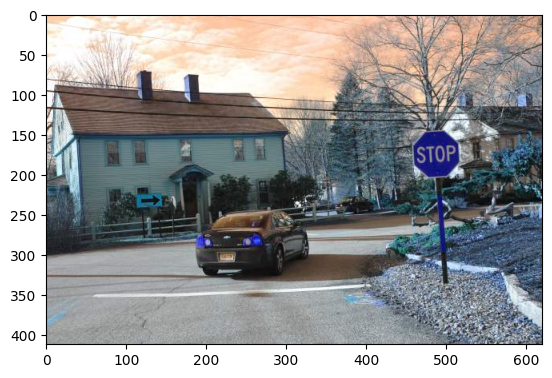

In [45]:
plt.imshow(stopsigns[0]);

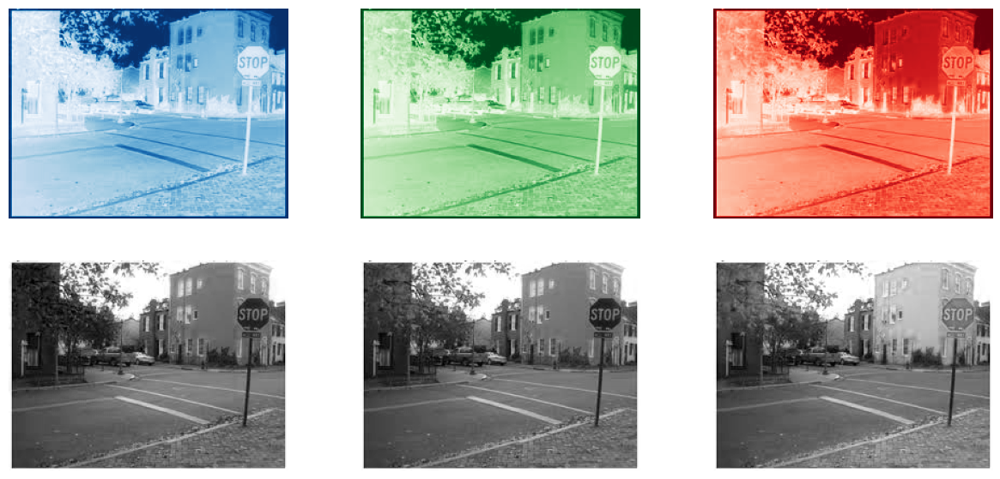

In [26]:
s = stopsigns[0]
b, g, r = cv2.split(s)

fig, ax = plt.subplots(ncols=3, nrows=2)
[a.axis('off') for a in ax.flatten()]
ax[0,0].imshow(b, cmap='Blues')
ax[0,1].imshow(g, cmap='Greens')
ax[0,2].imshow(r, cmap='Reds')
ax[1,0].imshow(b, cmap='gray')
ax[1,1].imshow(g, cmap='gray')
ax[1,2].imshow(r, cmap='gray')
fig.set_size_inches(15,7);

## Exercise 1

Convert the first stop sign image from BGR to RGB (`cv2.cvtColor(YOUR_IMAGE, cv2.COLOR_BGR2RGB)`), to HSV, and to LAB. 

For each colorspace, visualize the three channels (you probably want to use the gray colormap to compare between the three color spaces).

Which colorspace isolates the stop sign the best?

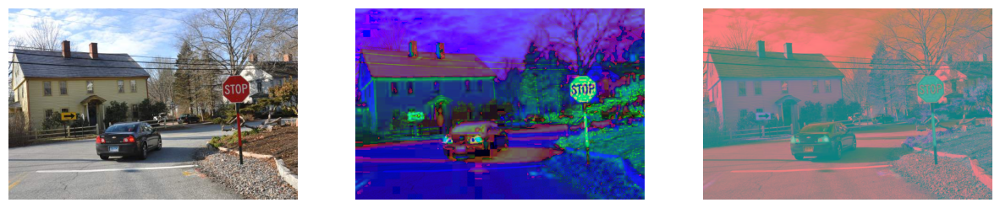

In [50]:
s = stopsigns[0]
b, g, r = cv2.split(s)

fig, ax = plt.subplots(ncols=3, nrows=1)
[a.axis('off') for a in ax.flatten()]
ax[0].imshow(cv2.cvtColor(stopsigns[0], cv2.COLOR_BGR2RGB))
ax[1].imshow(cv2.cvtColor(stopsigns[0], cv2.COLOR_BGR2HSV))
ax[2].imshow(cv2.cvtColor(stopsigns[0], cv2.COLOR_BGR2LAB))
fig.set_size_inches(15,7);
#HSV isolates it the best

## A dataset of stop sign images

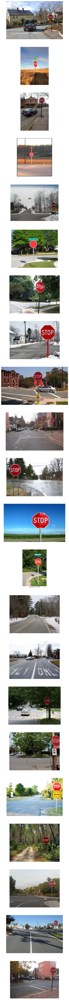

In [51]:
fig, ax = plt.subplots(nrows=len(stopsigns))
for (a,s) in zip(ax,stopsigns):
    a.imshow(cv2.cvtColor(s, cv2.COLOR_BGR2RGB))
    a.axis('off')
    
fig.set_size_inches(10, 5 * len(stopsigns))

## Exercise 2

Choose 4 images from the above dataset and plot each separate color channel in RGB, HSV, and LAB

Coordinate with your teammates so that each team member chooses 4 different images. (e.g., person A chooses [0:3], person B chooses [4:7], or you can shuffle the order).

Together, your team will be processing 20 images from the above dataset. For the rest of this lab, you will be working independently on your 4 images, and you will compare your answers at the end of all the exercises.

Once you have selected your four images, revisit your answer in exercise 1. Is it the same for the other 4 images in your dataset?

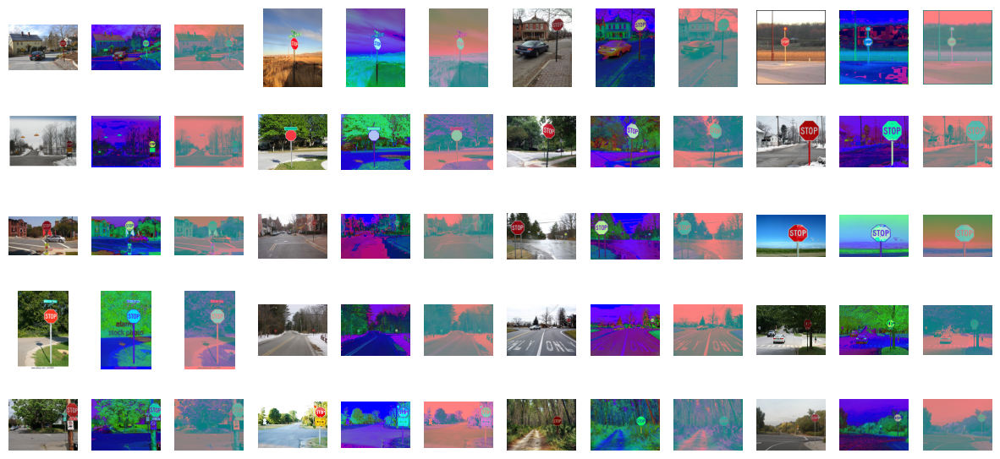

In [65]:
# combination of all our images

fig, ax = plt.subplots(ncols=12, nrows=5)
[a.axis('off') for a in ax.flatten()]
counter = 0
for x in range(5):
    for y in range(0, 12):
        ax[x, y].imshow(cv2.cvtColor(stopsigns[counter], cv2.COLOR_BGR2RGB))
        ax[x, y + 1].imshow(cv2.cvtColor(stopsigns[counter], cv2.COLOR_BGR2HSV))
        ax[x, y + 2].imshow(cv2.cvtColor(stopsigns[counter], cv2.COLOR_BGR2LAB))
        counter += 1
fig.set_size_inches(15,7);


# Exercise 3

Filter the H (*Hue*) channel of the first image. Find the range of blue values that include as much of the sky as possible.

Use http://colorizer.org/ to find the values in Hue that correspond to blue.

However, note that OpenCV does not allow Hue to extend all the way up to 360 degrees. Why?

See this answer: https://stackoverflow.com/questions/16685707/why-is-the-range-of-hue-0-180-in-opencv

An 8-bit value can only hold values from 0 to 255.

Therefore, in OpenCV, Hue values are between 0 and 180 (the values from colorizer are divided by 2)

To filter, use the `cv2.inRange` function. See the following tutorial:

https://docs.opencv.org/3.4.1/df/d9d/tutorial_py_colorspaces.html


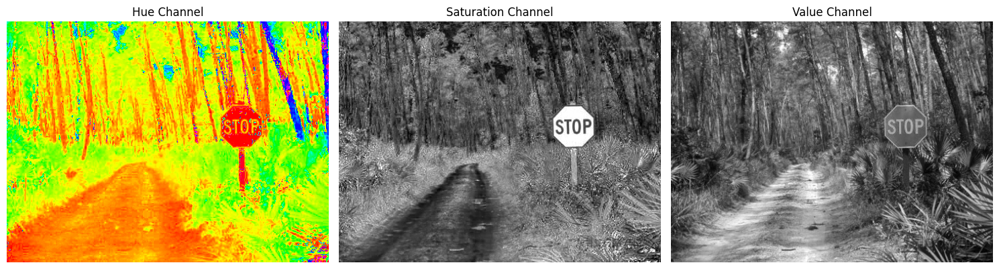

In [67]:
s = stopsigns[18]

hsv_image = cv2.cvtColor(s, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv_image)

fig, ax = plt.subplots(ncols=3, nrows=1, figsize=(15, 5))
[a.axis('off') for a in ax.flatten()]

ax[0].imshow(h, cmap='hsv')
ax[0].set_title('Hue Channel')

ax[1].imshow(s, cmap='gray')
ax[1].set_title('Saturation Channel')

ax[2].imshow(v, cmap='gray')
ax[2].set_title('Value Channel')

plt.tight_layout()
plt.show()

## Exercise 4

Can you find a good range of hue values that mask out the stop sign in the four images you chose in Exercise 2?

Two hints: 

1. Consider how polar coordinates work. Because hues are measured in angles, hue values from 0 to 5 degrees are very close to the values 355-360 (which are then divided by 2, if you are using OpenCV)
2. You might find that saturation and value also impact the hue for stop signs. Why? One example may be shadows. Can you name others?

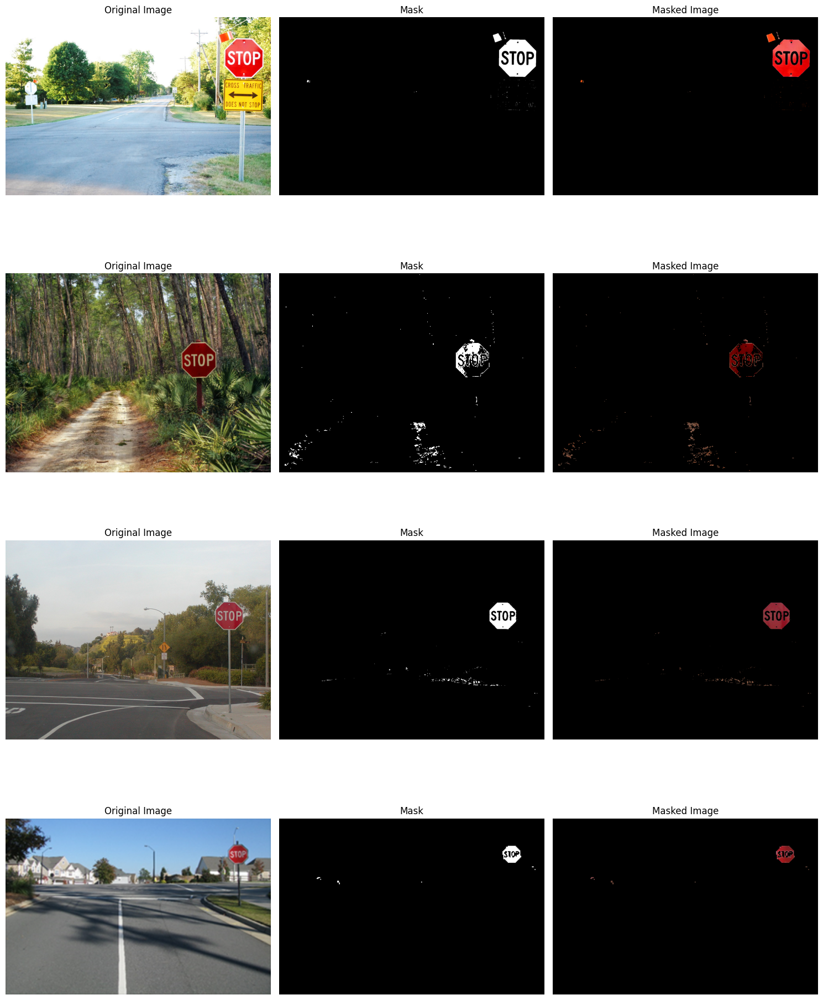

In [69]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def mask_red(image):
    # Convert the image to HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    lower_red1 = np.array([0, 100, 100])
    upper_red1 = np.array([10, 255, 255])
    lower_red2 = np.array([170, 100, 100])
    upper_red2 = np.array([180, 255, 255])

    mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
    mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
    
    mask = cv2.bitwise_or(mask1, mask2)
    
    result = cv2.bitwise_and(image, image, mask=mask)
    
    return mask, result

def visualize_images(images):
    fig, ax = plt.subplots(nrows=len(images), ncols=3, figsize=(15, 5 * len(images)))

    for i, img in enumerate(images):
        mask, result = mask_red(img)
        
        ax[i, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax[i, 0].set_title('Original Image')
        ax[i, 0].axis('off')

        ax[i, 1].imshow(mask, cmap='gray')
        ax[i, 1].set_title('Mask')
        ax[i, 1].axis('off')

        ax[i, 2].imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
        ax[i, 2].set_title('Masked Image')
        ax[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

images = [stopsigns[17], stopsigns[18], stopsigns[19], stopsigns[20]]

visualize_images(images)

## Bounding boxes

Adding bounding box rectangles to images:

https://stackoverflow.com/a/37437395

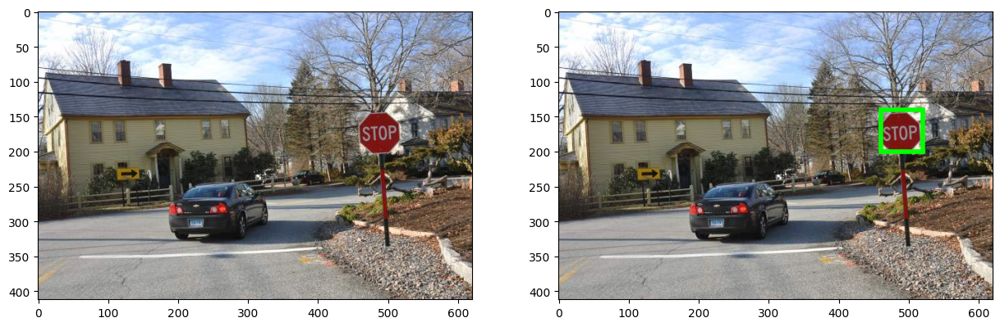

In [82]:
# plot an image on both the left and right
fig,ax = plt.subplots(ncols=2)
fig.set_size_inches(15,10)
ax[0].imshow(cv2.cvtColor(stopsigns[0], cv2.COLOR_BGR2RGB));
ax[1].imshow(cv2.cvtColor(stopsigns[0], cv2.COLOR_BGR2RGB));

# Define a bounding box:
bbox = Rectangle(xy=(460,140), width=60, height=60, linewidth=4, edgecolor='lime', facecolor='none')

# add the bounding box to the image on the right
ax[1].add_patch(bbox);


## Exercise 5

Choose a different image from your dataset. Manually define a bounding box around the stop sign in that image, using `Rectangle`.

What direction is positive X in? What direction is positive y in? Hint: think back to the Linear Regression exercise.

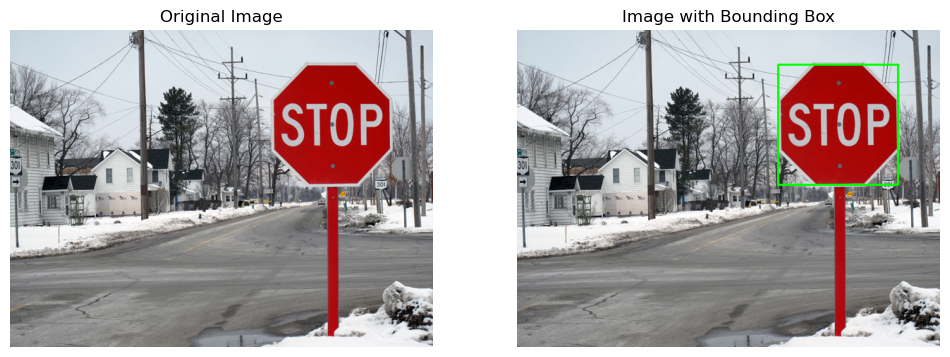

In [57]:
import cv2
import matplotlib.pyplot as plt

# Assuming stopsigns is a list of images, and you have already loaded it
# Choose a different image from the dataset
image = stopsigns[18]

# Manually define a bounding box around the stop sign
# Coordinates of the top-left and bottom-right corners of the bounding box
# These coordinates should be manually adjusted based on the image
top_left = (370, 50)
bottom_right = (540, 220)

# Draw the rectangle on the image
boxed_image = image.copy()
cv2.rectangle(boxed_image, top_left, bottom_right, (0, 255, 0), 2)

# Display the original image and the image with the bounding box
fig, ax = plt.subplots(ncols=2, figsize=(12, 6))

ax[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
ax[0].set_title('Original Image')
ax[0].axis('off')

ax[1].imshow(cv2.cvtColor(boxed_image, cv2.COLOR_BGR2RGB))
ax[1].set_title('Image with Bounding Box')
ax[1].axis('off')

plt.show()

## Exercise 6: Combining masking and morphology

For the four images you selected in Exercise 2, choose a colorspace and channel that you believe will work best for isolating stop signs.

1. Mask the five images using a narrow range of values in that channel.
2. Run erosion and dilation on the mask to reduce the amount of noise. What kernel sizes work best? If you want to run erosion immediately followed by dilation for the same kernel size, you can use `opening`:

https://docs.opencv.org/3.4.1/d9/d61/tutorial_py_morphological_ops.html

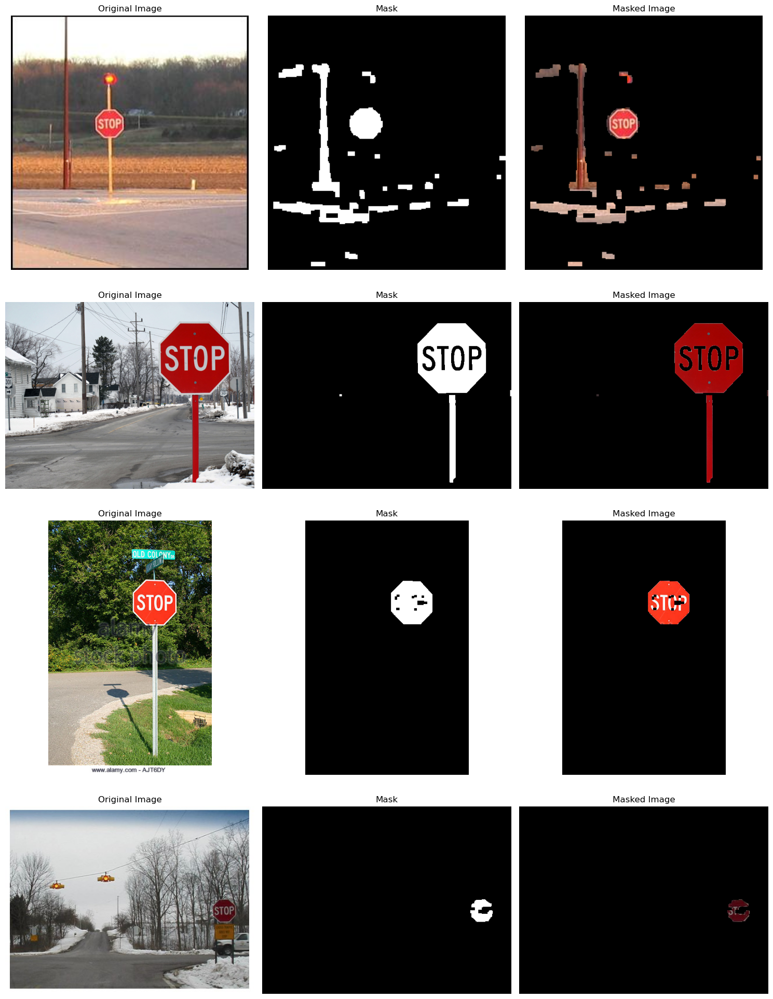

In [64]:
# Function to create a mask for red color
def mask_red(image):
    # Convert the image to HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define range for red color
    lower_red1 = np.array([0, 50, 50])
    upper_red1 = np.array([10, 255, 255])
    lower_red2 = np.array([170, 50, 50])
    upper_red2 = np.array([180, 255, 255])

    # Create masks for the red ranges
    mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
    mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
    
    # Combine the masks
    mask = cv2.bitwise_or(mask1, mask2)
    
    return mask

# Function to apply morphological operations to reduce noise
def reduce_noise(mask):
    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=2)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel, iterations=2)
    return closing

# Visualize the original and masked images
def visualize_images(images):
    fig, ax = plt.subplots(nrows=len(images), ncols=3, figsize=(15, 5 * len(images)))

    for i, img in enumerate(images):
        mask = mask_red(img)
        mask_cleaned = reduce_noise(mask)
        result = cv2.bitwise_and(img, img, mask=mask_cleaned)
        
        ax[i, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax[i, 0].set_title('Original Image')
        ax[i, 0].axis('off')

        ax[i, 1].imshow(mask_cleaned, cmap='gray')
        ax[i, 1].set_title('Mask')
        ax[i, 1].axis('off')

        ax[i, 2].imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
        ax[i, 2].set_title('Masked Image')
        ax[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

# Assuming stopsigns is a list of images, and you have already loaded it
images = [stopsigns[17], stopsigns[18], stopsigns[19], stopsigns[20]]

visualize_images(images)

## Exercise 7 - Compare with your team mates
Some images will have a lot of "noise" - in other words, for any choice of color channel, and any two values for `inRange` which mask stop sign pixels, a lot of pixels which don't come from the stop sign will also be included by the filter. What causes this? Which images are most prone to noise? What's significantly different about those images compared to the others?

Noise is mainly caused by poor picture quality, and unwanted background objects/colors of similar hues/saturations/values can interfere with what we are trying to detect. The images that have a lot of one color, or have a lot of red (like the stop sign) are the most prone to noise. Photos in dark environments are also very supceptible to noise.

## When you are done:


1. Double-check that you filled in your name at the top of the notebook!
2. Click `File` -> `Export Notebook As` -> `PDF`
3. Email the PDF to `YOURTEAMNAME@beaver.works` 

## Stretch Goal: Combining Linear Regression and Color Segmentation

A lot of the above images have solid white lines or solid yellow lines, due to traffic lane markings. A lot of the images also have solid black lines (telephone poles), and solid green lines (the pole of the stop sign).

1. Choose some images that contain lines (at least 5). 
2. For each image, find a good color threshold which can mask the line or lines out.
3. Add in erosion, dilation, opening, or other morphological operations to improve the quality of the mask.
4. For each image, use OpenCV's linear regression function `cv2.fitLine` to plot the line of best fit from your results in the previous step.

See the following tutorial for `cv2.fitLine`: https://docs.opencv.org/3.4.1/dd/d49/tutorial_py_contour_features.html